In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import plotly.express as px
import ppscore as pps
from src import Experiment as ex
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.metrics import confusion_matrix, precision_score, recall_score
from sklearn.metrics import f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
%matplotlib inline

### **DATA EXTRACTION**

In [2]:
df = pd.read_excel('data/loan.xlsx')

In [3]:
df.tail()

,Member_ID,systemloanid,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,loanamount,totaldue,effective_date,due_date,paid_off_time,ReferredBy,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status,Purpose
94,LP001325,301978868,Male,No,0,Not Graduate,No,3620,0,20000,21900,2016-11-09,2016-10-10 00:00:00,2016-10-10 13:00:00,LP001097,120.0,Good,Semiurban,Y,car
95,LP001326,302001119,Male,No,0,Graduate,NaN,6782,0,10000,11500,2016-11-09,2016-10-10 00:00:00,2016-08-10 20:49:00,LP001098,360.0,Good,Urban,N,business
96,LP001327,301966525,Female,Yes,0,Graduate,No,2484,2302,40000,44800,2016-11-09,9/25/2016,9/20/2016 5:38,LP001099,360.0,Bad,Semiurban,Y,education
97,LP001333,301994809,Male,Yes,0,Graduate,No,1977,997,40000,44800,2016-11-09,2016-10-10 00:00:00,2016-10-10 09:01:00,LP001100,360.0,Good,Semiurban,Y,business
98,LP001334,301981912,Male,Yes,0,Not Graduate,No,4188,0,40000,44000,2016-11-09,2016-10-10 00:00:00,2016-10-10 09:01:00,LP001101,180.0,Good,Semiurban,Y,radio/TV


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99 entries, 0 to 98
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Member_ID          99 non-null     object        
 1   systemloanid       99 non-null     int64         
 2   Gender             98 non-null     object        
 3   Married            99 non-null     object        
 4   Dependents         99 non-null     object        
 5   Education          99 non-null     object        
 6   Self_Employed      93 non-null     object        
 7   ApplicantIncome    99 non-null     int64         
 8   CoapplicantIncome  99 non-null     int64         
 9   loanamount         99 non-null     int64         
 10  totaldue           99 non-null     int64         
 11  effective_date     99 non-null     datetime64[ns]
 12  due_date           99 non-null     object        
 13  paid_off_time      99 non-null     object        
 14  ReferredBy  

### Data Cleaning and Feature Engineering

In [5]:
ex.memory_stats(df)

,Memory
Index,128
Member_ID,6435
systemloanid,792
Gender,6040
Married,5909
Dependents,3489
Education,6527
Self_Employed,5692
ApplicantIncome,792
CoapplicantIncome,792


In [6]:
display(df.iloc[1])

Member_ID                       LP001003
systemloanid                   301965204
Gender                              Male
Married                              Yes
Dependents                             1
Education                       Graduate
Self_Employed                         No
ApplicantIncome                     4583
CoapplicantIncome                   1508
loanamount                         10000
totaldue                           13000
effective_date       2016-08-09 00:00:00
due_date             2016-07-10 00:00:00
paid_off_time        2016-07-10 09:00:00
ReferredBy                      LP001004
Loan_Amount_Term                     360
Credit_History                      Good
Property_Area                      Rural
Loan_Status                            N
Purpose                         radio/TV
Name: 1, dtype: object

In [7]:
df.isna().sum()

Member_ID            0
systemloanid         0
Gender               1
Married              0
Dependents           0
Education            0
Self_Employed        6
ApplicantIncome      0
CoapplicantIncome    0
loanamount           0
totaldue             0
effective_date       0
due_date             0
paid_off_time        0
ReferredBy           0
Loan_Amount_Term     5
Credit_History       0
Property_Area        0
Loan_Status          0
Purpose              0
dtype: int64

In [8]:
df.isna().any()

Member_ID            False
systemloanid         False
Gender                True
Married              False
Dependents           False
Education            False
Self_Employed         True
ApplicantIncome      False
CoapplicantIncome    False
loanamount           False
totaldue             False
effective_date       False
due_date             False
paid_off_time        False
ReferredBy           False
Loan_Amount_Term      True
Credit_History       False
Property_Area        False
Loan_Status          False
Purpose              False
dtype: bool

In [9]:
df.duplicated().any()

False

In [10]:
ex.transform_datetime(df, 'paid_off_time', 'paid_second', how='second')
ex.transform_datetime(df, 'paid_off_time', 'paid_minute', how='minute')
ex.transform_datetime(df, 'paid_off_time', 'paid_hour', how='hour')
ex.transform_datetime(df, 'paid_off_time', 'paid_day', how='day')
ex.transform_datetime(df, 'paid_off_time', 'paid_month', how=' month')
ex.transform_datetime(df, 'paid_off_time', 'paid_year', how='year')
ex.transform_datetime(df, 'paid_off_time', 'paid_date')
ex.transform_datetime(df, 'due_date', 'due_date')
ex.transform_datetime(df, 'due_date', 'DueSec', how='second')
ex.transform_datetime(df, 'due_date', 'DueMin', how='minute')
ex.transform_datetime(df, 'due_date', 'DueHour', how='hour')
ex.transform_datetime(df, 'due_date', 'DueMonth', how='month')
ex.transform_datetime(df, 'due_date', 'DueYear', how='year')
ex.transform_datetime(df, 'due_date', 'DueDay', how='day')
ex.transform_datetime(df, 'effective_date', 'EffectiveMonth', how='month')
ex.transform_datetime(df, 'effective_date', 'EffectiveYear', how='year')
ex.transform_datetime(df, 'effective_date', 'EffectiveDay', how='day')
ex.transform_datetime(df, 'effective_date', 'effective_date')

,Member_ID,systemloanid,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,loanamount,...,paid_date,DueSec,DueMin,DueHour,DueMonth,DueYear,DueDay,EffectiveMonth,EffectiveYear,EffectiveDay
0,LP001002,301994762,Male,No,0,Graduate,No,5849,0,10000,...,2016-09-14,0,0,0,7,2016,10,8,2016,9
1,LP001003,301965204,Male,Yes,1,Graduate,No,4583,1508,10000,...,2016-07-10,0,0,0,7,2016,10,8,2016,9
2,LP001005,301966580,Male,Yes,0,Graduate,Yes,3000,0,20000,...,2016-09-25,0,0,0,7,2016,10,8,2016,9


In [11]:
df['paid_month'] = pd.DatetimeIndex(df['paid_off_time']).month

In [12]:
drp = ['systemloanid', 'EffectiveYear', 'DueYear', 'DueHour', 'DueMin', 'DueSec',
       'paid_year', 'paid_second', 'Member_ID', 'ReferredBy', 'effective_date',
       'due_date', 'paid_date', 'paid_off_time', 'EffectiveMonth']
df.drop(drp, axis=1, inplace=True)

In [13]:
num_cols = list(df.describe().columns)
cat_cols = list(set(df.columns).difference(num_cols))
irrelevant = ['systemloanid', 'RefferedBy', 'Member_ID']
numerical = [e for e in num_cols if e not in irrelevant]

In [14]:
categorical_cols = []

for k, v in df.iteritems():
  if v.dtype == 'object':
    categorical_cols.append(k)
print(categorical_cols)

['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed', 'Credit_History', 'Property_Area', 'Loan_Status', 'Purpose']


In [15]:
df.fillna(method='bfill', inplace=True)

In [16]:
df.head(20)

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,loanamount,totaldue,Loan_Amount_Term,...,Property_Area,Loan_Status,Purpose,paid_minute,paid_hour,paid_day,paid_month,DueMonth,DueDay,EffectiveDay
0,Male,No,0,Graduate,No,5849,0,10000,13000,360.0,...,Urban,Y,radio/TV,31,19,14,9,7,10,9
1,Male,Yes,1,Graduate,No,4583,1508,10000,13000,360.0,...,Rural,N,radio/TV,0,9,10,7,7,10,9
2,Male,Yes,0,Graduate,Yes,3000,0,20000,23800,360.0,...,Urban,Y,education,58,16,25,9,7,10,9
3,Male,Yes,0,Not Graduate,No,2583,2358,10000,11500,360.0,...,Urban,Y,furniture/equipment,0,20,22,9,9,22,9
4,Male,No,0,Graduate,No,6000,0,10000,11500,360.0,...,Urban,Y,car,36,21,23,9,8,10,9
5,Male,Yes,2,Graduate,Yes,5417,4196,20000,23800,360.0,...,Urban,Y,education,45,13,9,9,9,15,9
6,Male,Yes,0,Not Graduate,No,2333,1516,30000,39000,360.0,...,Urban,Y,furniture/equipment,7,23,10,7,8,10,9
7,Male,Yes,3+,Graduate,No,3036,2504,20000,24500,360.0,...,Semiurban,N,car,33,20,10,5,8,10,9
8,Male,Yes,2,Graduate,No,4006,1526,10000,13000,360.0,...,Urban,Y,radio/TV,0,16,10,8,8,10,9
9,Male,Yes,1,Graduate,No,12841,10968,10000,11500,360.0,...,Semiurban,N,car,0,13,24,9,9,24,9


In [17]:
df.isna().any()

Gender               False
Married              False
Dependents           False
Education            False
Self_Employed        False
ApplicantIncome      False
CoapplicantIncome    False
loanamount           False
totaldue             False
Loan_Amount_Term     False
Credit_History       False
Property_Area        False
Loan_Status          False
Purpose              False
paid_minute          False
paid_hour            False
paid_day             False
paid_month           False
DueMonth             False
DueDay               False
EffectiveDay         False
dtype: bool

In [18]:
df.rename(columns={
    'Self_Employed': 'SelfEmployed',
    'loanamount': 'LoanAmount',
    'totaldue': 'TotalDue',
    'Loan_Amount_Term': 'LoanAmountTerm',
    'Credit_History': 'CreditHistory',
    'Property_Area': 'PropertyArea',
    'Loan_Status': 'LoanStatus',
    'paid_minute': 'PaidMin',
    'paid_second': 'PaidSec',
    'paid_hour': 'PaidHour',
    'paid_month': 'PaidMonth',
    'paid_day': 'PaidDay'
}, inplace=True)

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99 entries, 0 to 98
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Gender             99 non-null     object 
 1   Married            99 non-null     object 
 2   Dependents         99 non-null     object 
 3   Education          99 non-null     object 
 4   SelfEmployed       99 non-null     object 
 5   ApplicantIncome    99 non-null     int64  
 6   CoapplicantIncome  99 non-null     int64  
 7   LoanAmount         99 non-null     int64  
 8   TotalDue           99 non-null     int64  
 9   LoanAmountTerm     99 non-null     float64
 10  CreditHistory      99 non-null     object 
 11  PropertyArea       99 non-null     object 
 12  LoanStatus         99 non-null     object 
 13  Purpose            99 non-null     object 
 14  PaidMin            99 non-null     int64  
 15  PaidHour           99 non-null     int64  
 16  PaidDay            99 non-nu

In [20]:
df2 = df.copy()

In [21]:
objs = df.select_dtypes(include='object')

In [22]:
for k, v in objs.iteritems():
  print(k, v.unique())

Gender ['Male' 'Female']
Married ['No' 'Yes']
Dependents [0 1 2 '3+' 3]
Education ['Graduate' 'Not Graduate']
SelfEmployed ['No' 'Yes']
CreditHistory ['Good' 'Bad']
PropertyArea ['Urban' 'Rural' 'Semiurban']
LoanStatus ['Y' 'N']
Purpose ['radio/TV' 'education' 'furniture/equipment' 'car' 'business'
 'domestic appliances' 'repairs' 'vacation/others']


In [23]:
gen = {'Male': 0, 'Female': 1}
mar = {'No': 0, 'Yes': 1}
dep = {0: 0, 1: 1, 2: 2, 3: 3, '3+': 4}
ed = {'Not Graduate': 0, 'Graduate': 1}
self = {'No': 0, 'Yes': 1}
credit = {'Bad': 0, 'Good': 1}
stats = {'N': 0, 'Y': 1}
area = {'Rural': 0, 'Urban': 1, 'Semiurban': 3}
purp = {
    'radio/TV': 0,
    'education': 1,
    'furniture/equipment': 2,
    'car': 3,
    'business': 4,
    'domestic appliances': 5,
    'repairs': 6,
    'vacation/others': 7
}

In [24]:
df['Gender'] = df['Gender'].map(gen)
df['Married'] = df['Married'].map(mar)
df['Education'] = df['Education'].map(ed)
df['SelfEmployed'] = df['SelfEmployed'].map(self)
df['Dependents'] = df['Dependents'].map(dep)
df['CreditHistory'] = df['CreditHistory'].map(credit)
df['LoanStatus'] = df['LoanStatus'].map(stats)
df['PropertyArea'] = df['PropertyArea'].map(area)
df['Purpose'] = df['Purpose'].map(purp)

In [25]:
df.tail()

,Gender,Married,Dependents,Education,SelfEmployed,ApplicantIncome,CoapplicantIncome,LoanAmount,TotalDue,LoanAmountTerm,...,PropertyArea,LoanStatus,Purpose,PaidMin,PaidHour,PaidDay,PaidMonth,DueMonth,DueDay,EffectiveDay
94,0,0,0,0,0,3620,0,20000,21900,120.0,...,3,1,3,0,13,10,10,10,10,9
95,0,0,0,1,0,6782,0,10000,11500,360.0,...,1,0,4,49,20,10,8,10,10,9
96,1,1,0,1,0,2484,2302,40000,44800,360.0,...,3,1,1,38,5,20,9,9,25,9
97,0,1,0,1,0,1977,997,40000,44800,360.0,...,3,1,4,1,9,10,10,10,10,9
98,0,1,0,0,0,4188,0,40000,44000,180.0,...,3,1,0,1,9,10,10,10,10,9


In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99 entries, 0 to 98
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Gender             99 non-null     int64  
 1   Married            99 non-null     int64  
 2   Dependents         99 non-null     int64  
 3   Education          99 non-null     int64  
 4   SelfEmployed       99 non-null     int64  
 5   ApplicantIncome    99 non-null     int64  
 6   CoapplicantIncome  99 non-null     int64  
 7   LoanAmount         99 non-null     int64  
 8   TotalDue           99 non-null     int64  
 9   LoanAmountTerm     99 non-null     float64
 10  CreditHistory      99 non-null     int64  
 11  PropertyArea       99 non-null     int64  
 12  LoanStatus         99 non-null     int64  
 13  Purpose            99 non-null     int64  
 14  PaidMin            99 non-null     int64  
 15  PaidHour           99 non-null     int64  
 16  PaidDay            99 non-nu

### Exploratory Data Analysis

In [27]:
ex.memory_stats(df)

,Memory
Index,128
Gender,792
Married,792
Dependents,792
Education,792
SelfEmployed,792
ApplicantIncome,792
CoapplicantIncome,792
LoanAmount,792
TotalDue,792


In [28]:
df.describe()

,Gender,Married,Dependents,Education,SelfEmployed,ApplicantIncome,CoapplicantIncome,LoanAmount,TotalDue,LoanAmountTerm,...,PropertyArea,LoanStatus,Purpose,PaidMin,PaidHour,PaidDay,PaidMonth,DueMonth,DueDay,EffectiveDay
count,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,...,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.0
mean,0.151515,0.686869,0.808081,0.767677,0.141414,4146.707071,1681.959596,17878.787879,21106.818182,342.424242,...,1.717172,0.636364,2.040404,18.282828,13.686869,17.000000,8.929293,9.252525,16.181818,9.0
std,0.360375,0.466127,1.192466,0.424463,0.350222,2257.670884,1948.642976,9397.429878,10354.797036,60.154409,...,1.097682,0.483494,1.834584,19.093775,5.271499,7.016017,1.162795,0.675269,7.007814,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,1000.000000,0.000000,10000.000000,11125.000000,60.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,3.000000,7.000000,10.000000,9.0
25%,0.000000,0.000000,0.000000,1.000000,0.000000,2676.500000,0.000000,10000.000000,13000.000000,360.000000,...,1.000000,0.000000,0.000000,0.000000,9.000000,10.000000,9.000000,9.000000,10.000000,9.0
50%,0.000000,1.000000,0.000000,1.000000,0.000000,3600.000000,1526.000000,10000.000000,13000.000000,360.000000,...,1.000000,1.000000,2.000000,12.000000,13.000000,15.000000,9.000000,9.000000,10.000000,9.0
75%,0.000000,1.000000,1.500000,1.000000,0.000000,4725.000000,2347.000000,20000.000000,24500.000000,360.000000,...,3.000000,1.000000,3.000000,34.500000,17.500000,24.000000,9.000000,10.000000,25.000000,9.0
max,1.000000,1.000000,4.000000,1.000000,1.000000,12841.000000,10968.000000,40000.000000,44800.000000,480.000000,...,3.000000,1.000000,7.000000,58.000000,23.000000,30.000000,12.000000,10.000000,25.000000,9.0


In [29]:
df.corr()

,Gender,Married,Dependents,Education,SelfEmployed,ApplicantIncome,CoapplicantIncome,LoanAmount,TotalDue,LoanAmountTerm,...,PropertyArea,LoanStatus,Purpose,PaidMin,PaidHour,PaidDay,PaidMonth,DueMonth,DueDay,EffectiveDay
Gender,1.000000,-0.261390,-0.169094,0.165760,-0.090649,-0.053937,-0.147420,0.035609,0.038619,0.124096,...,0.238412,-0.090508,-0.055656,0.001123,-0.044599,0.080716,0.171933,0.092758,0.134439,NaN
Married,-0.261390,1.000000,0.313012,-0.113567,0.211512,-0.026957,0.250708,-0.013412,-0.005473,-0.023599,...,0.024576,0.123483,0.062676,-0.268549,-0.152435,0.003120,-0.078919,-0.102822,0.045721,NaN
Dependents,-0.169094,0.313012,1.000000,-0.109148,0.212250,0.125140,0.124653,0.017936,0.028060,-0.115785,...,-0.002914,-0.016090,-0.024405,0.009131,-0.029137,0.052445,-0.054041,-0.091265,0.087252,NaN
Education,0.165760,-0.113567,-0.109148,1.000000,-0.119950,0.124245,0.125935,0.028682,0.042618,0.318015,...,0.032740,-0.018080,0.103904,0.188234,-0.000921,0.027412,0.028401,-0.042433,0.017776,NaN
SelfEmployed,-0.090649,0.211512,0.212250,-0.119950,1.000000,0.104599,-0.061908,-0.031944,-0.032064,-0.113310,...,-0.001072,0.005478,-0.088391,0.189279,0.046338,-0.074750,-0.075424,-0.023099,-0.093736,NaN
ApplicantIncome,-0.053937,-0.026957,0.125140,0.124245,0.104599,1.000000,0.084797,-0.152410,-0.157086,0.009028,...,-0.078497,-0.112649,0.154702,0.027775,0.044637,0.054739,0.026225,-0.053055,0.055794,NaN
CoapplicantIncome,-0.147420,0.250708,0.124653,0.125935,-0.061908,0.084797,1.000000,-0.073319,-0.076337,0.033228,...,0.082181,-0.038583,0.089173,-0.053911,0.013727,0.116835,-0.169743,-0.062658,0.133351,NaN
LoanAmount,0.035609,-0.013412,0.017936,0.028682,-0.031944,-0.152410,-0.073319,1.000000,0.994594,0.030851,...,0.099520,-0.036750,-0.083759,0.047735,-0.091818,0.088216,-0.041880,0.004873,0.108181,NaN
TotalDue,0.038619,-0.005473,0.028060,0.042618,-0.032064,-0.157086,-0.076337,0.994594,1.000000,0.035972,...,0.093919,-0.030021,-0.104034,0.062762,-0.086957,0.087125,-0.054622,-0.014039,0.112230,NaN
LoanAmountTerm,0.124096,-0.023599,-0.115785,0.318015,-0.113310,0.009028,0.033228,0.030851,0.035972,1.000000,...,-0.001873,-0.116736,0.028692,0.138700,0.019151,0.127659,-0.070466,-0.115707,0.144180,NaN


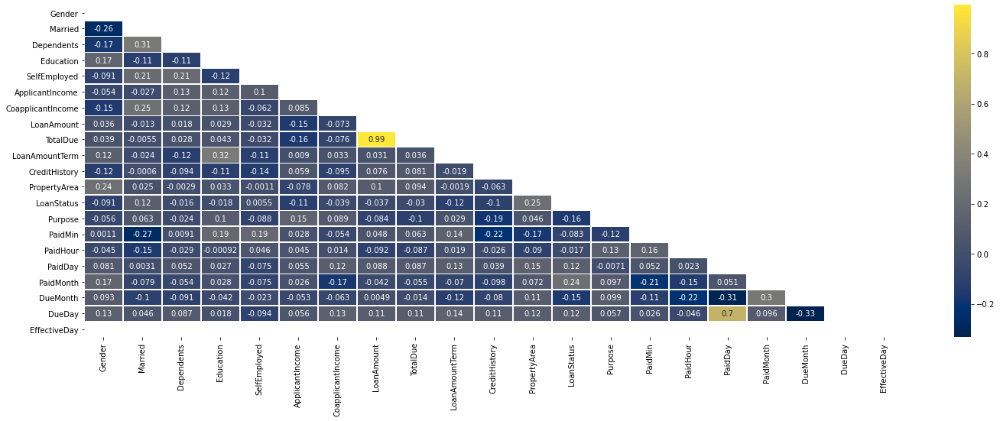

In [30]:
ex.corr_heatmap(df, mask=True)

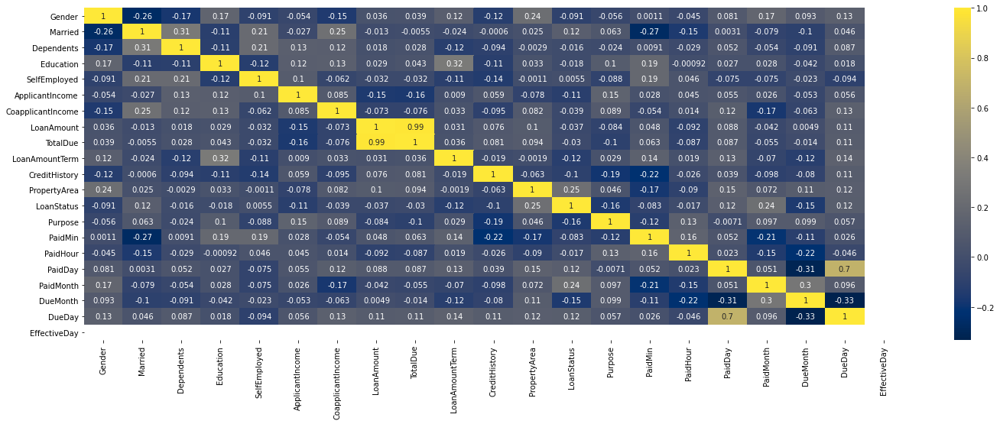

In [31]:
ex.corr_heatmap(df, mask=False)

<AxesSubplot:title={'center':'PPS matrix'}, xlabel='feature', ylabel='target'>

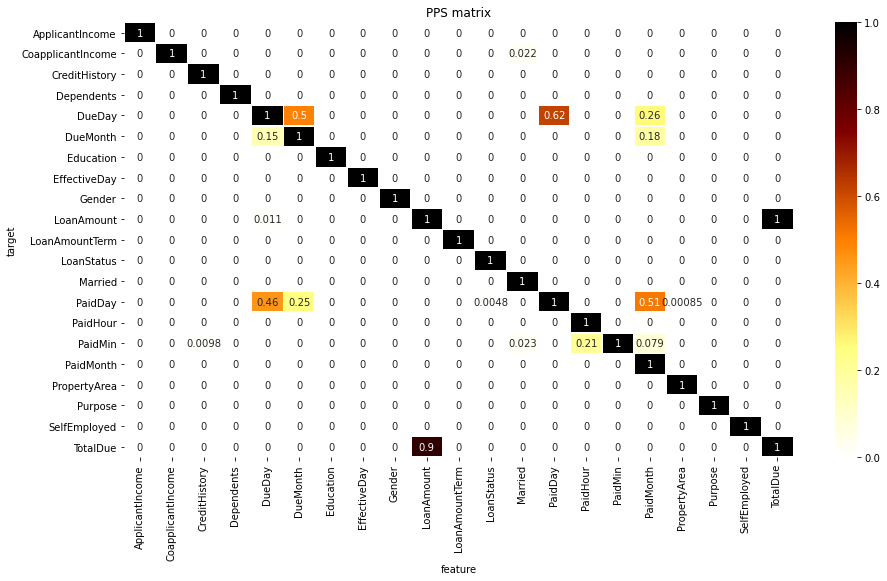

In [32]:
ex.pps_heatmap(df)

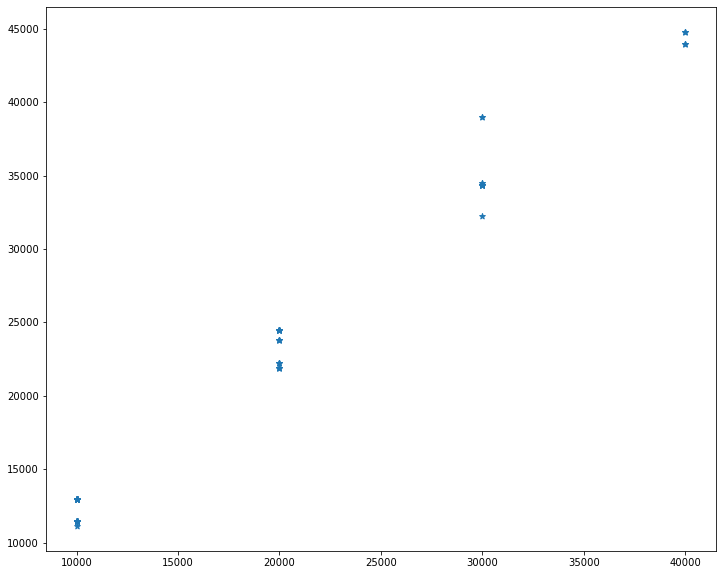

In [33]:
plt.figure(figsize=(12, 10))
plt.scatter(x='LoanAmount', y='TotalDue', cmap='cividis', marker='*', data=df)
plt.show()

In [34]:
px.scatter(
    df, x='ApplicantIncome', y='LoanAmount', size='TotalDue', color='Gender'
)

In [35]:
for k, v in df.iteritems():
  if v.dtype == 'object':
    print(count_values(k, 'barh'))

<Figure size 1728x576 with 0 Axes>

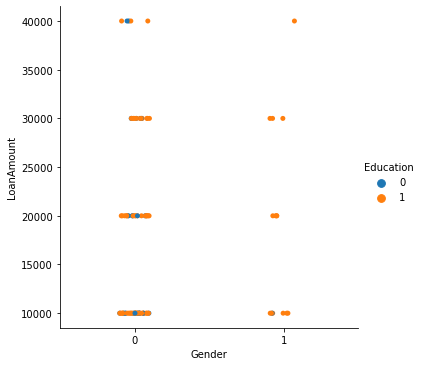

In [36]:
plt.figure(figsize=(24, 8))
sb.catplot(x='Gender', y='LoanAmount', hue='Education', data=df)
plt.show()

<Figure size 1728x576 with 0 Axes>

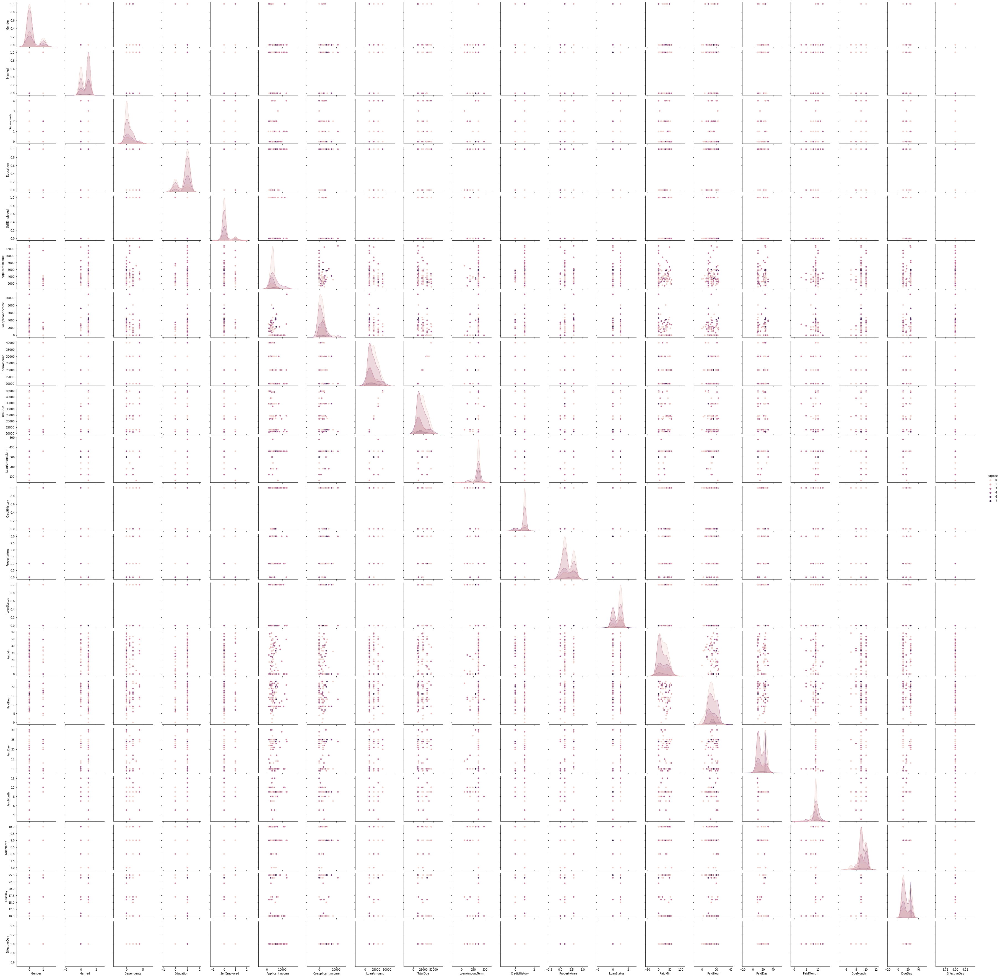

In [37]:
plt.figure(figsize=(24, 8))
sb.pairplot(df, hue='Purpose')
plt.show()

In [38]:
from sklearn.model_selection import train_test_split

In [39]:
from sklearn.tree import DecisionTreeClassifier

In [40]:
tre = DecisionTreeClassifier(random_state=0)

In [41]:
tre.fit(df.loc[:, df.columns != 'LoanStatus'], df['LoanStatus'])

DecisionTreeClassifier(random_state=0)

In [42]:
tre.feature_importances_

array([0.03521164, 0.        , 0.0218254 , 0.        , 0.        ,
       0.18752362, 0.00727513, 0.05674603, 0.05192744, 0.        ,
       0.        , 0.20410053, 0.06730159, 0.21011905, 0.08366402,
       0.02328042, 0.05102513, 0.        , 0.        , 0.        ])

In [43]:
news_cols = df.loc[:, df.columns != 'LoanStatus'].columns

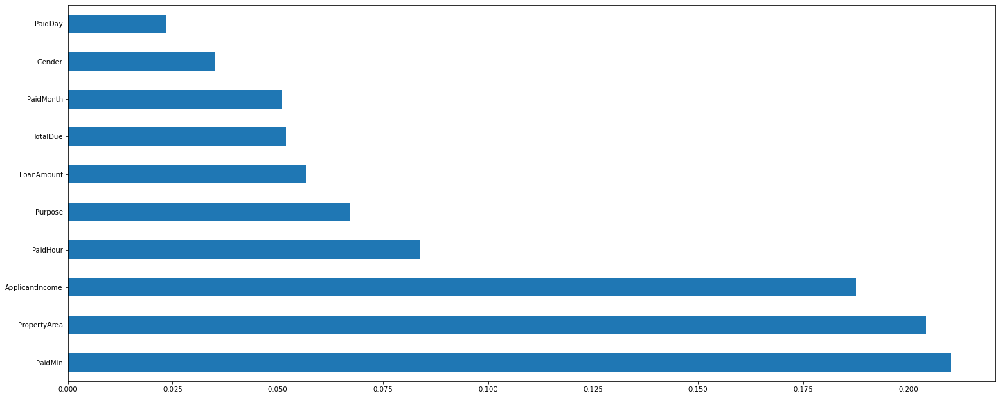

In [44]:
plt.figure(figsize=(24, 10))
pd.Series(
    tre.feature_importances_, index=news_cols
).nlargest(10).plot(kind='barh')
plt.show()

In [45]:
features = ['DueDay', 'PaidDay', 'ApplicantIncome', 'LoanAmount', 'PropertyArea',
            'Married', 'CoapplicantIncome', 'Education']
X = df.loc[:, features]
y = df['LoanStatus']

In [46]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=0
)

In [47]:
clf_svm = SVC(C=0.1, kernel='linear')

##### **Fit data without scaling**

In [48]:
clf_svm.fit(X_train, y_train)

SVC(C=0.1, kernel='linear')

In [49]:
clf_svm.score(X_train, y_train)

0.6455696202531646

##### **Fit data after scaling**

In [50]:
clf_svm = SVC(C=0.1, kernel='linear')

In [51]:
scale = StandardScaler()
X_train_scl = scale.fit_transform(X_train)

In [52]:
clf_svm.fit(X_train_scl, y_train)

SVC(C=0.1, kernel='linear')

In [53]:
clf_svm.score(X_train_scl, y_train)

0.6708860759493671

In [54]:
res = cross_val_score(
    clf_svm, X_train_scl, y_train, scoring='accuracy', cv=10, n_jobs=-1,
    verbose=3
)

print(
    "Average Accuracy:", (np.mean(res))
)
print(
    "Accuracy Std Dev:", (np.std(res))
)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
Average Accuracy: 0.6571428571428571
Accuracy Std Dev: 0.06277998511159624
[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:    2.7s remaining:    6.4s
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:    2.8s remaining:    1.2s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    2.8s finished


In [55]:
pred = cross_val_predict(
    clf_svm, X_train_scl, y_train, cv=5, n_jobs=-1, verbose=3
)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished


In [56]:
ex.confusion_matrix(y_train, pred)

Predicted         
                 Negative Positive
Actual Negative         1       25
       Positive         2       51

In [57]:
print(
    "Precision Score:", (precision_score(y_train, pred))
)
print(
    "Recall Score:", (recall_score(y_train, pred))
)
print(
    "F1 Score:", (f1_score(y_train, pred))
)

Precision Score: 0.6710526315789473
Recall Score: 0.9622641509433962
F1 Score: 0.7906976744186047


In [58]:
ex.confusion_matrix(y_train, clf_svm.predict(scale.fit_transform(X_train)))

Predicted         
                 Negative Positive
Actual Negative         0       26
       Positive         0       53

### Perform Hyper-Parameter Optimization 

In [59]:
from sklearn.model_selection import GridSearchCV

In [60]:
params = {
    'C': np.arange(0.01, 100, 0.5)
}

In [61]:
ex.param_optimization(clf_svm, params, X_train_scl, y_train, cv=5)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
Fitting 5 folds for each of 200 candidates, totalling 1000 fits
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.1s
Best Paramaters:  {'C': 0.01}
Best Score:  0.6708333333333333
Best Estimator:  SVC(C=0.01, kernel='linear')
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:    1.3s finished


In [62]:
est = SVC(kernel='rbf')

In [64]:
ex.param_optimization(est, params, X_train_scl, y_train, cv=5)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.9s
Best Paramaters:  {'C': 1.01}
Best Score:  0.7083333333333333
Best Estimator:  SVC(C=1.01)
[Parallel(n_jobs=-1)]: Done 912 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:    3.4s finished


#### Apply Optimised Parameters on the estimator

In [65]:
clf = SVC(C=1.01, kernel='rbf')

In [66]:
clf.fit(X_train_scl, y_train)

SVC(C=1.01)

### Calculate Metrics
##### Accuracy Score

In [67]:
ex.mean_accuracy_score(clf, X_train_scl, y_train, cv=10)

Average Accuracy: 0.7214285714285714
Average Standard Deviation: 0.1343920551587627
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished


##### Precision, Recall and F1 Scores

In [68]:
print('Precision Score:', (precision_score(y_train, clf.predict(X_train_scl))))
print('Recall Score:', (recall_score(y_train, clf.predict(X_train_scl))))
print('F1 Score:', (f1_score(y_train, clf.predict(X_train_scl))))

Precision Score: 0.8
Recall Score: 0.9811320754716981
F1 Score: 0.8813559322033898


##### Weighted precision and recall score.

In [69]:
print('Precision Score:', (precision_score(y_train,clf.predict(X_train_scl),
                                           average='weighted')))
print('Recall Score:', (recall_score(y_train,clf.predict(X_train_scl),
                                        average='weighted')))
print('F1 Score:', (f1_score(y_train,clf.predict(X_train_scl),
                             average='weighted')))

Precision Score: 0.8423146473779385
Recall Score: 0.8227848101265823
F1 Score: 0.80521347350354


##### Confusion Matrix

In [70]:
ex.confusion_matrix(y_train, clf.predict(X_train_scl))

Predicted         
                 Negative Positive
Actual Negative        13       13
       Positive         1       52

### Precision Recall TradeOff

In [71]:
from sklearn.metrics import precision_recall_curve, roc_auc_score, roc_curve

In [72]:
y_scores = cross_val_predict(clf, X_train_scl, y_train, cv=3,
                            method='decision_function')

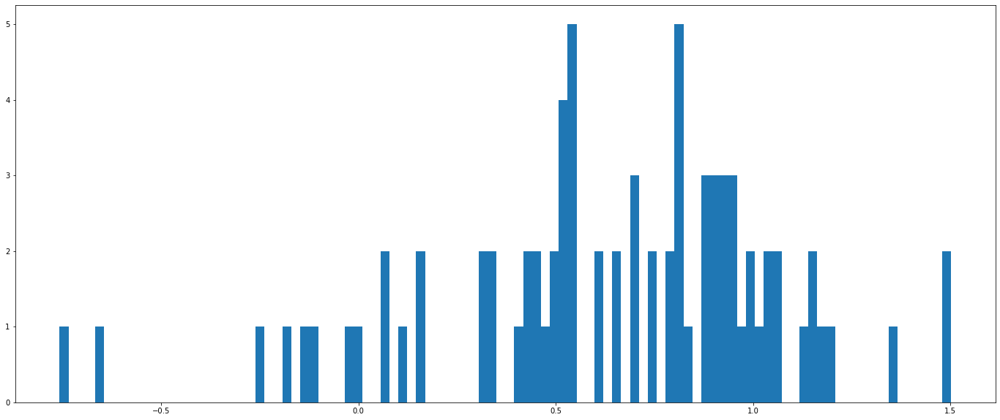

In [73]:
plt.figure(figsize=(24, 10))
plt.hist(y_scores, bins=100)
plt.show()

In [74]:
precisions, recalls, thresholds = precision_recall_curve(y_train, y_scores)

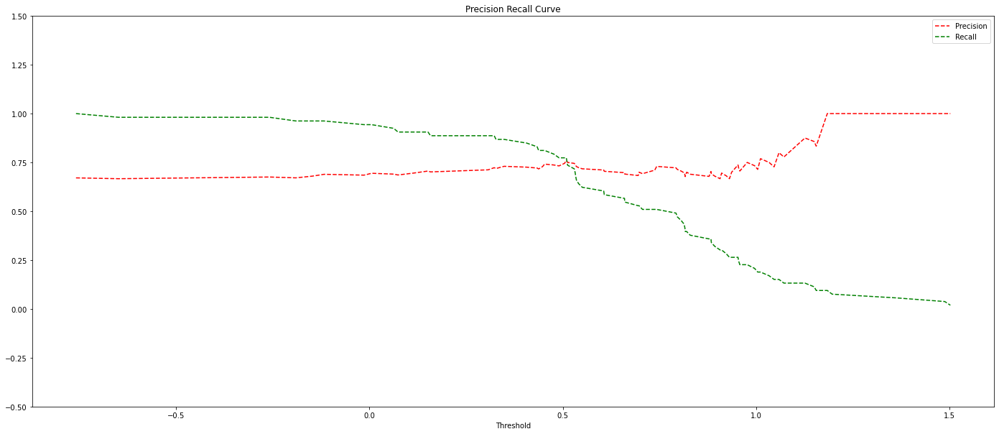

In [75]:
ex.plot_prc_figure(precisions, recalls, thresholds)

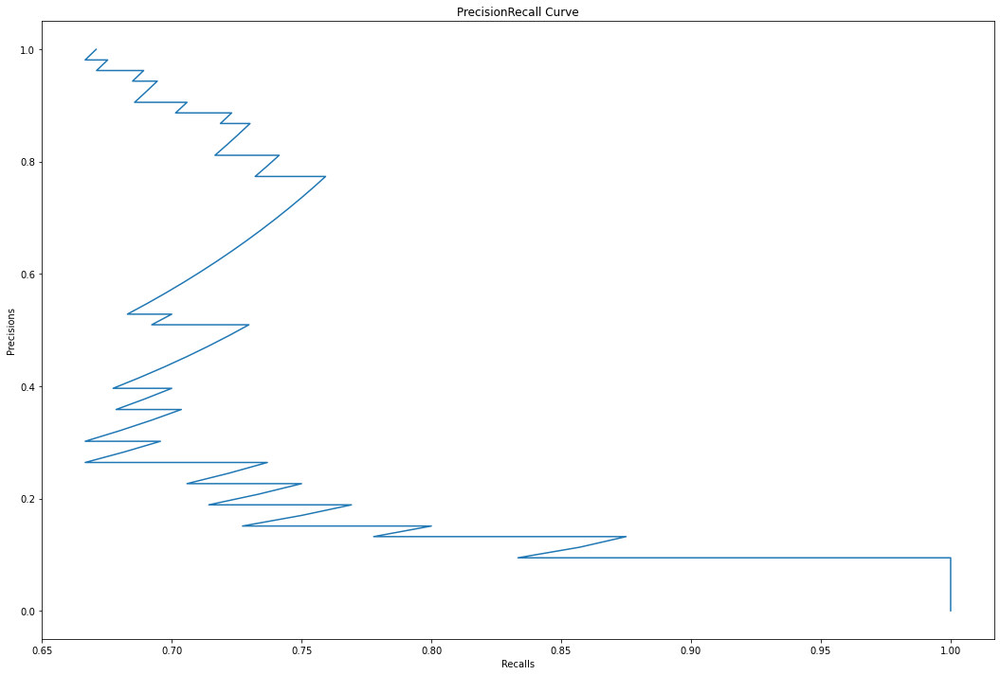

In [76]:
plt.figure(figsize=(18, 12))
plt.plot(precisions, recalls)
plt.xlabel('Recalls')
plt.ylabel('Precisions')
plt.title('PrecisionRecall Curve')
plt.show()

#### Altering Precision

In [77]:
len(precisions)
len(thresholds)

79

In [78]:
idx = len(precisions[precisions < 0.9])
thresholds[idx]

1.1836408253503607

In [79]:
y_ppred = (y_scores > thresholds[idx])

In [80]:
print('Precision Score:', (precision_score(y_train, y_ppred)))
print('Recall Score:', (recall_score(y_train, y_ppred)))
print('F1 Score:', (f1_score(y_train, y_ppred)))

Precision Score: 1.0
Recall Score: 0.07547169811320754
F1 Score: 0.14035087719298245


In [81]:
print('Precision Score:', (precision_score(y_train, y_ppred,
                                           average='weighted')))
print('Recall Score:', (recall_score(y_train, y_ppred,
                                        average='weighted')))
print('F1 Score:', (f1_score(y_train, y_ppred,
                             average='weighted')))

Precision Score: 0.7849789029535865
Recall Score: 0.379746835443038
F1 Score: 0.26360424183657544


#### Altering Recall

In [82]:
idx_rec = len(recalls[recalls > 0.9])
y_rec = (y_scores > thresholds[idx_rec])

In [83]:
print('Precision Score:', (precision_score(y_train, y_rec)))
print('Recall Score:', (recall_score(y_train, y_rec)))
print('F1 Score:', (f1_score(y_train, y_rec)))

Precision Score: 0.7121212121212122
Recall Score: 0.8867924528301887
F1 Score: 0.7899159663865547


In [84]:
print('Precision Score:', (precision_score(y_train, y_rec, average='weighted')))
print('Recall Score:', (recall_score(y_train, y_rec, average='weighted')))
print('F1 Score:', (f1_score(y_train, y_rec, average='weighted')))

Precision Score: 0.6549673954737246
Recall Score: 0.6835443037974683
F1 Score: 0.6480870829344397


### Receiver Operating Characteristics (R.O.C) Curve

In [85]:
fpr, tpr, thresholds = roc_curve(y_train, y_scores)

ROC Score: 0.5921625544267054


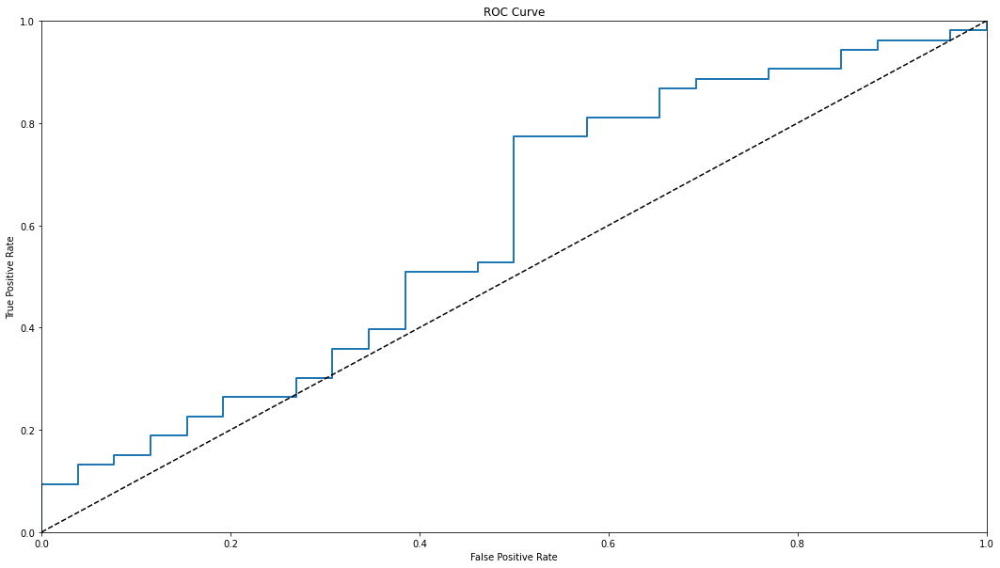

In [86]:
ex.roc_curve_plot(fpr, tpr, y_train, y_scores)

In [87]:
ex.plot_roc_curve(fpr, tpr, thresholds)